# Stores with liquor licenses distribution based on black population distribution in the City of Washington D.C., 2020
This dataset provides information on the spatial distribution of stores with liquor licenses based on the black population within the City of Washington D.C. in 2020. We have determined liquor licenses to be an "unhealthy" indicator when considering access to healthy food in D.C.

Name: Rachel Seiberg

First, I need to import the pandas, geopandas, and folium libraries to conduct my data exploration and  visualization

In [1]:
import pandas as pd
import geopandas as gpd
import folium

Next, I am uploading my data on liquor licenses to Jupyter notebook

In [2]:
liq = pd.read_csv('Liquor_Licenses.csv')

# Initial inspection of the data
In order to get familiar with my data, I am executing a few functions:

In [3]:
liq.shape

(2243, 41)

In [4]:
liq.head()

,X,Y,LICENSE,APPLICANT,TRADE_NAME,CLASS,ADDRESS,ZIPCODE,WARD,ANC,...,YCOORD,LONGITUDE,LATITUDE,GIS_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,OBJECTID
0,-77.031549,38.897027,ABRA-000001,National Press Club of Washington,National Press Club,C,529 14TH STREET NW,20045,Ward 2,ANC 2C,...,136574.85,-77.031547,38.897019,ABRALicenseePt_1,{36A31358-161C-4533-A08E-FC5306477588},JLAY,2022/08/31 18:04:53+00,JLAY,2022/08/31 18:04:53+00,4801
1,-77.083582,38.957499,ABRA-000010,Pauls Liquors Inc.,Pauls Discount Wine & Liquor,A,5205 WISCONSIN AVENUE NW,20015,Ward 3,ANC 3E,...,143290.69,-77.083579,38.957492,ABRALicenseePt_2,{46323846-6F1F-4459-A270-C3D9AF62CB07},JLAY,2022/08/31 18:04:53+00,JLAY,2022/08/31 18:04:53+00,4802
2,-77.026685,38.906238,ABRA-000023,Don Ho Inc,District Liquors,A,1211 11TH STREET NW,20001,Ward 2,ANC 2F,...,137597.25,-77.026682,38.906231,ABRALicenseePt_3,{CE005EA3-22AE-4BC3-B862-1C8ECCA8B7EE},JLAY,2022/08/31 18:04:53+00,JLAY,2022/08/31 18:04:53+00,4803
3,-77.047696,38.896311,ABRA-000037,The Fischer Corporation,Riverside Liquors,A,2123 E STREET NW,20037,Ward 2,ANC 2A,...,136495.99,-77.047693,38.896303,ABRALicenseePt_4,{7B4C17C9-477F-4A04-B9CA-70DF99D88D54},JLAY,2022/08/31 18:04:53+00,JLAY,2022/08/31 18:04:53+00,4804
4,-77.036162,38.905004,ABRA-000056,The University Club,"University Club of Washington, DC",C,1135 16TH STREET NW,20036,Ward 2,ANC 2B,...,137460.50,-77.036160,38.904996,ABRALicenseePt_5,{D5E6318F-DB2D-463C-8FD3-F2D06E25127D},JLAY,2022/08/31 18:04:53+00,JLAY,2022/08/31 18:04:53+00,4805


In [5]:
liq.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2243 entries, 0 to 2242
Data columns (total 41 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   X                  2243 non-null   float64
 1   Y                  2243 non-null   float64
 2   LICENSE            2243 non-null   object 
 3   APPLICANT          2243 non-null   object 
 4   TRADE_NAME         2243 non-null   object 
 5   CLASS              2243 non-null   object 
 6   ADDRESS            2243 non-null   object 
 7   ZIPCODE            2243 non-null   int64  
 8   WARD               2243 non-null   object 
 9   ANC                2243 non-null   object 
 10  SMD                2243 non-null   object 
 11  STATUS             2243 non-null   object 
 12  TYPE               2243 non-null   object 
 13  BREW_PUB           9 non-null      object 
 14  ENTERTAINMENT      727 non-null    object 
 15  SALES_CONSUMPTION  17 non-null     object 
 16  SIDEWALK_CAFE      521 n

I want to change a column title, trade name, which is the store name. I want to change the title from trade name to store.

In [6]:
liq.rename(columns={'TRADE_NAME':'STORE'}, inplace=True)
liq.head()

,X,Y,LICENSE,APPLICANT,STORE,CLASS,ADDRESS,ZIPCODE,WARD,ANC,...,YCOORD,LONGITUDE,LATITUDE,GIS_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,OBJECTID
0,-77.031549,38.897027,ABRA-000001,National Press Club of Washington,National Press Club,C,529 14TH STREET NW,20045,Ward 2,ANC 2C,...,136574.85,-77.031547,38.897019,ABRALicenseePt_1,{36A31358-161C-4533-A08E-FC5306477588},JLAY,2022/08/31 18:04:53+00,JLAY,2022/08/31 18:04:53+00,4801
1,-77.083582,38.957499,ABRA-000010,Pauls Liquors Inc.,Pauls Discount Wine & Liquor,A,5205 WISCONSIN AVENUE NW,20015,Ward 3,ANC 3E,...,143290.69,-77.083579,38.957492,ABRALicenseePt_2,{46323846-6F1F-4459-A270-C3D9AF62CB07},JLAY,2022/08/31 18:04:53+00,JLAY,2022/08/31 18:04:53+00,4802
2,-77.026685,38.906238,ABRA-000023,Don Ho Inc,District Liquors,A,1211 11TH STREET NW,20001,Ward 2,ANC 2F,...,137597.25,-77.026682,38.906231,ABRALicenseePt_3,{CE005EA3-22AE-4BC3-B862-1C8ECCA8B7EE},JLAY,2022/08/31 18:04:53+00,JLAY,2022/08/31 18:04:53+00,4803
3,-77.047696,38.896311,ABRA-000037,The Fischer Corporation,Riverside Liquors,A,2123 E STREET NW,20037,Ward 2,ANC 2A,...,136495.99,-77.047693,38.896303,ABRALicenseePt_4,{7B4C17C9-477F-4A04-B9CA-70DF99D88D54},JLAY,2022/08/31 18:04:53+00,JLAY,2022/08/31 18:04:53+00,4804
4,-77.036162,38.905004,ABRA-000056,The University Club,"University Club of Washington, DC",C,1135 16TH STREET NW,20036,Ward 2,ANC 2B,...,137460.50,-77.036160,38.904996,ABRALicenseePt_5,{D5E6318F-DB2D-463C-8FD3-F2D06E25127D},JLAY,2022/08/31 18:04:53+00,JLAY,2022/08/31 18:04:53+00,4805


# Data trimming
Next, I'd like to create a new variable (desired_columns) to keep only the necessary columns

In [7]:
desired_columns = ['STORE','CLASS','ADDRESS','LATITUDE','LONGITUDE']

In [8]:
liq[desired_columns].sample(5)

,STORE,CLASS,ADDRESS,LATITUDE,LONGITUDE
1535,District Space,Caterer,3522 12TH STREET NE,38.933161,-76.991289
558,Mandu,C,453 K STREET NW,38.902826,-77.017893
1477,Brine,C,1357 H STREET NE,38.899999,-76.986433
1609,The Block,C,1110 VERMONT AVENUE NW,38.904328,-77.033258
271,Charlie Palmer Steak,C,101 CONSTITUTION AVENUE NW,38.892820,-77.013074


In order to save these changes, I'm making a copy of my data and creating a new variable

In [9]:
liq_trimmed = liq[desired_columns].copy()

In [10]:
liq_trimmed = liq_trimmed.dropna()

# Mapping!

First, I want to see the basemap I'm planning to use

In [11]:
m = folium.Map(location=[38.9072,-77.0369], 
               zoom_start = 11,
               tiles='CartoDB positron', 
               attribution='CartoDB')
m

Next, I'm adding in census tracts data for Washington D.C. (from last week) to layer on top of the basemap so that I can visualize the stores with liquor licenses in relation to race and ethnicity

In [31]:
tracts=gpd.read_file('Census_Tracts_in_2020.geojson')
tracts.head(2)

,OBJECTID,TRACT,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,P0010007,...,P0050004,P0050005,P0050006,P0050007,P0050008,P0050009,P0050010,SHAPEAREA,SHAPELEN,geometry
0,1,002002,11001002002,4072,3647,1116,1751,27,84,0,...,0,0,0,32,0,0,32,0,0,"POLYGON ((-77.03642 38.94975, -77.03643 38.948..."
1,2,002101,11001002101,5687,5071,1037,2642,86,120,1,...,0,0,0,31,0,0,31,0,0,"POLYGON ((-77.02824 38.95813, -77.02824 38.958..."


I'm trimming the census tract data to only include the GeoID and geometry, because that's all I really need

In [13]:
tracts_trimmed=['GEOID','geometry']

Next, I want to add markers to the stores with liquor licenses so that I can map them

In [14]:
for index, row in liq_trimmed.iterrows():
    print(row.STORE, row.LATITUDE, row.LONGITUDE)

National Press Club 38.89701925 -77.03154662
Pauls Discount Wine & Liquor 38.95749202 -77.08357933
District Liquors 38.9062306 -77.02668249
Riverside Liquors 38.89630337 -77.04769324
University Club of Washington, DC 38.90499616 -77.0361599
The Metropolitan Club Of The City Of Washington 38.8999739 -77.03980603
Bassin's Mac Arthur Liquors 38.91780782 -77.09637383
The Army & Navy Club 38.9017224 -77.03824582
Cosmos Club 38.91143732 -77.04768664
Trio Rest & Fox & Hounds Lounge 38.91098064 -77.03826427
Chat's Liquors 38.88251903 -76.99526722
Sulgrave Club 38.90945598 -77.04199805
Schneider's of Capitol Hill 38.89463277 -77.00134628
Mr. Henry's 38.88514316 -76.99827828
Irving Wine & Spirits 38.92889553 -77.0376217
Woman's National Democratic Club 38.91093038 -77.04266708
Cairo Liquor Store 38.91177606 -77.03885516
The Monocle 38.89457477 -77.00516182
Jumbo Liquors 38.9003901 -76.99065831
Hayden's, Inc. 38.88777076 -76.99597747
Wah Sing Restaurant 38.87285971 -76.97032504
Tune Inn Restauran

I'm using a for loop to map these markers onto the basemap

In [15]:
for index, row in liq_trimmed.iterrows():
    folium.Marker([row.LATITUDE, row.LONGITUDE], popup=row.STORE, tooltip=row.STORE).add_to(m)
m

Now I'm adding the census tracts layer 

In [16]:
folium.GeoJson(tracts, name="geojson").add_to(m)
folium.LayerControl().add_to(m)
m

In order to create the visualization with race and ethnicity with stores with liquor licenses, I need to add the Social Explorer data that houses race and ethnicity data for Washington DC in 2020

In [17]:
race= pd.read_csv('census_race_ethnicity_2020.csv')

From last week, I know that I need to ensure that the data points related to FIPS are strings, rather than integers

In [18]:
race= pd.read_csv(
    'census_race_ethnicity_2020.csv',
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY':str
    }
)

I'm also cleaning up this data set by making sure that I remove all empty cells

In [19]:
race=race.dropna(axis=1,how="all")

I'm also cleaning the data based on last week by keeping those same columns and removing the rest

In [20]:
columns_to_keep=['Geo_FIPS',
                 'SE_A04001_001',
                 'SE_A04001_002',
                 'SE_A04001_003',
                 'SE_A04001_004',
                 'SE_A04001_005',
                 'SE_A04001_006',
                 'SE_A04001_007',
                 'SE_A04001_008',
                 'SE_A04001_009',
                 'SE_A04001_010',
                 'SE_A04001_011',
                 'SE_A04001_012',
                 'SE_A04001_013',
                 'SE_A04001_014',
                 'SE_A04001_015',
                 'SE_A04001_016',
                 'SE_A04001_017',]

In [21]:
race2 = race[columns_to_keep]
race2

,Geo_FIPS,SE_A04001_001,SE_A04001_002,SE_A04001_003,SE_A04001_004,SE_A04001_005,SE_A04001_006,SE_A04001_007,SE_A04001_008,SE_A04001_009,SE_A04001_010,SE_A04001_011,SE_A04001_012,SE_A04001_013,SE_A04001_014,SE_A04001_015,SE_A04001_016,SE_A04001_017
0,11001000101,1250,1099,1029,0,0,54,0,14,2,151,149,0,0,0,0,0,2
1,11001000102,3318,2931,2700,34,0,150,0,12,35,387,168,0,0,0,0,135,84
2,11001000201,3972,3519,2200,239,25,894,0,0,161,453,285,8,0,0,0,92,68
3,11001000202,4665,4298,3728,131,0,285,18,0,136,367,193,11,0,0,0,129,34
4,11001000300,6504,5693,5017,178,0,379,0,38,81,811,569,0,0,0,0,0,242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201,11001010900,3400,3359,53,2863,0,12,0,0,431,41,0,17,0,0,0,0,24
202,11001011001,2345,1997,1097,764,0,29,0,0,107,348,348,0,0,0,0,0,0
203,11001011002,1760,1676,1197,342,0,40,0,0,97,84,50,0,0,0,0,31,3
204,11001011100,5227,4073,506,3273,11,138,0,9,136,1154,276,254,0,0,0,274,350


Renaming the columns in my race/ethnicity dataset

In [22]:
race2.columns= ['FIPS',
                'Total Population',
                'Not Hispanic or Latino',
                'Not Hispanic or Latino White Alone',
                'Not Hispanic or Latino Black Alone',
                'Not Hispanic or Latino American Indian and Alaska Native Alone',
                'Not Hispanic or Latino Asian Alone',
                'Not Hispanic or Latino Native Hawaiian and other Pacific Islander Alone',
                'Not Hispanic or Latino Some Other Race Alone',
                'Not Hispanic or Latino Two or More Races',
                'Hispanic or Latino',
                'Hispanic or Latino White Alone',
                'Hispanic or Latino Black Alone',
                'Hispanic or Latino American Indian and Alaska Native Alone',
                'Hispanic or Latino Asian Alone',
                'Hispanic or Latino Native Hawaiian and other Pacific Islander Alone',
                'Hispanic or Latino Some Other Race Alone',
                'Hispanic or Latino Two or More Races']

In order to merge the race/ethnicity data with census tracts, I need to make the FIPS columns synonymous

In [23]:
tracts['FIPS'] ='11' + '001' + tracts['TRACT']
tracts.head(2)

,OBJECTID,TRACT,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,P0010007,...,P0050005,P0050006,P0050007,P0050008,P0050009,P0050010,SHAPEAREA,SHAPELEN,geometry,FIPS
0,1,002002,11001002002,4072,3647,1116,1751,27,84,0,...,0,0,32,0,0,32,0,0,"POLYGON ((-77.03642 38.94975, -77.03643 38.948...",11001002002
1,2,002101,11001002101,5687,5071,1037,2642,86,120,1,...,0,0,31,0,0,31,0,0,"POLYGON ((-77.02824 38.95813, -77.02824 38.958...",11001002101


Next, merge census tracts with race/ethnicity!

In [24]:
tracts_race=tracts.merge(race2,on="FIPS")
tracts_race.head(2)

,OBJECTID,TRACT,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,P0010007,...,Not Hispanic or Latino Some Other Race Alone,Not Hispanic or Latino Two or More Races,Hispanic or Latino,Hispanic or Latino White Alone,Hispanic or Latino Black Alone,Hispanic or Latino American Indian and Alaska Native Alone,Hispanic or Latino Asian Alone,Hispanic or Latino Native Hawaiian and other Pacific Islander Alone,Hispanic or Latino Some Other Race Alone,Hispanic or Latino Two or More Races
0,1,002002,11001002002,4072,3647,1116,1751,27,84,0,...,0,95,978,329,0,0,0,0,277,372
1,2,002101,11001002101,5687,5071,1037,2642,86,120,1,...,0,128,1266,249,130,0,0,0,812,75


Since I'm most interested in looking at concentrations of race/ethnicity in D.C., I'm going to create new variables based on black percentage of population and white percentage of population

In [25]:
tracts_race['PCT_Black'] = tracts_race['Not Hispanic or Latino Black Alone']/tracts_race['Total Population']*100
tracts_race['PCT_White'] = tracts_race['Not Hispanic or Latino White Alone']/tracts_race['Total Population']*100

I'm now going to map the census tracts based on percent black to see what I'm working with

<AxesSubplot: >

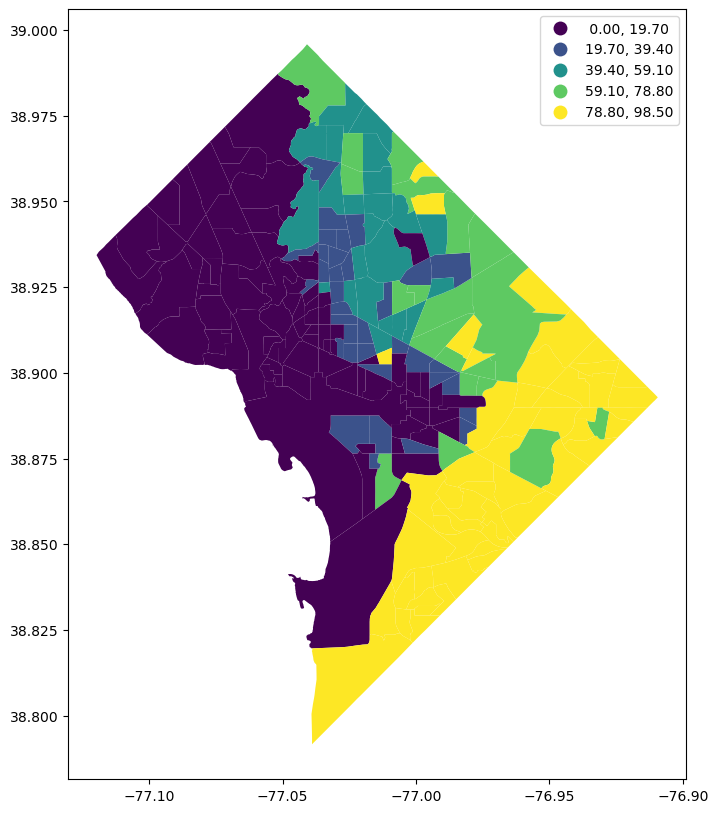

In [26]:
tracts_race.plot(figsize=(12,10),
                 column='PCT_Black',
                 legend=True, 
                 scheme='equal_interval')

Next, I'm going to create a chloropleth version of this map based on the black population percentage in each census tract

In [27]:
m = folium.Map(location=[38.9072, -77.0369], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

In [28]:
folium.Choropleth(
                  geo_data=tracts_race, 
                  data=tracts_race,         
                  key_on='feature.properties.FIPS', 
                  columns=['FIPS', 'PCT_Black'], 
                  fill_color='YlGn',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, 
                  legend_name='Percent Black').add_to(m)

In [29]:
m

Finally, I use a for loop to add the markers for stores with liquor licenses onto the chloropleth map above

In [30]:
for index, row in liq_trimmed.iterrows():
    folium.Marker([row.LATITUDE, row.LONGITUDE], popup=row.STORE, tooltip=row.STORE).add_to(m)
m

The map above shows all of the locations of stores with liquor licenses. I can use the interactive feature of the chloropleth map to see if there's a disproportionate amount of these stores in census tracts with a high percentage black population. This will help our overarching goal to assess food access (including healthy food) in Washington D.C.